In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Loading our transformer model

In [110]:
import torch, timm, re
from torch.serialization import safe_globals
from timm.models.vision_transformer import VisionTransformer, PatchEmbed, Block, Mlp, Attention

ckpt_path = "/kaggle/input/25epochs_final_vit/transformers/default/1/25epoch_final_vit_activity.pth"

# Safe-load model
with safe_globals([VisionTransformer, PatchEmbed, Block, Mlp, Attention]):
    obj = torch.load(ckpt_path, map_location="cpu", weights_only=True)

sd = obj["state_dict"] if isinstance(obj, dict) and "state_dict" in obj else obj

# Strip prefixes 
def drop_prefix(sd, prefixes=("vit.", "model.vit.", "model.")):
    keys = list(sd.keys())
    for pref in prefixes:
        if all(k.startswith(pref) for k in keys):
            return {k[len(pref):]: v for k,v in sd.items()}
    # fallback: strip 'vit.' when present
    return { (k[4:] if k.startswith("vit.") else k): v for k,v in sd.items() }

sd = drop_prefix(sd)
sd = { (k[7:] if k.startswith("module.") else k): v for k,v in sd.items() }  # DataParallel

# Infer embed_dim to pick arch 
if "cls_token" in sd:
    embed_dim = sd["cls_token"].shape[-1]
elif "patch_embed.proj.weight" in sd:
    embed_dim = sd["patch_embed.proj.weight"].shape[0]
else:
    raise RuntimeError("Cannot infer embed_dim from checkpoint.")

arch_map = {192: "vit_tiny_patch16_224",
            384: "vit_small_patch16_224",
            768: "vit_base_patch16_224",
            1024:"vit_large_patch16_224"}
arch = arch_map.get(int(embed_dim), "vit_base_patch16_224")
print(f"Detected embed_dim={embed_dim} -> using {arch}")


num_classes = None
for k in ("head.weight","classifier.weight","fc.weight"):
    if k in sd and sd[k].ndim == 2:
        num_classes = int(sd[k].shape[0]); break

kwargs = {}
if num_classes is not None:
    kwargs["num_classes"] = num_classes

model = timm.create_model(arch, pretrained=False, **kwargs)


missing, unexpected = model.load_state_dict(sd, strict=False)
print(f"Loaded into {arch}. Unexpected: {len(unexpected)}")
print("unexpected:", unexpected[:5])

device = "cuda" if torch.cuda.is_available() else "cpu"
model = model.eval().to(device)
print("Model ready on:", device)


Detected embed_dim=768 -> using vit_base_patch16_224
Loaded into vit_base_patch16_224. Unexpected: 2
unexpected: ['classifier.weight', 'classifier.bias']
Model ready on: cuda


# Grad-Cam Visualization

In [58]:
import torch
import timm
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F
from torchvision import transforms

## Reading frames

In [59]:
import cv2

def read_video_frames(video_path, max_frames=64):
    cap = cv2.VideoCapture(video_path)
    frames = []
    count = 0
    while cap.isOpened() and count < max_frames:
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)
        count += 1
    cap.release()
    return frames

frames_walking = read_video_frames("/kaggle/input/har-dataset/Walking/Walking_229.mp4")
frames_sitting = read_video_frames("/kaggle/input/har-dataset/Sitting/Sitting_129.mp4")
frames_standing = read_video_frames("/kaggle/input/har-dataset/Standing/Standing_129.mp4")


## Grad-Cam heatmap function

In [60]:

def vit_basic_gradcam_heatmap_vivid(model, x, class_idx=None):
    x = x.clone().detach().requires_grad_(True)
    logits = model(x)
    if class_idx is None:
        class_idx = logits.argmax(dim=-1).item()
    score = logits[0, class_idx]

    model.zero_grad()
    score.backward(retain_graph=True)

    grad = x.grad[0].cpu().numpy()  # (3,H,W)
    grad = np.mean(np.abs(grad), axis=0)

    grad = np.power(grad, 0.7)  # enhance contrast
    grad = (grad - grad.min()) / (grad.max() - grad.min() + 1e-8)
    return grad

def overlay_heatmap_vivid(hm, frame, alpha=0.6, colormap=cv2.COLORMAP_JET):
    H,W,_ = frame.shape
    hm = cv2.resize(hm, (W,H))
    hm_u8 = np.uint8(50 + 205*hm)
    hm_color = cv2.applyColorMap(hm_u8, colormap)
    hm_color = cv2.cvtColor(hm_color, cv2.COLOR_BGR2RGB)
    overlay = (frame.astype(np.float32)*(1-alpha) + hm_color.astype(np.float32)*alpha)
    return np.clip(overlay, 0, 255).astype(np.uint8)


## Processing Frames

In [61]:
import torch.nn.functional as F

# Convert a frame to ViT input
def preprocess_frame(frame, target_size=224, device="cuda"):
    
    frame = torch.tensor(frame/255., dtype=torch.float32).permute(2,0,1).unsqueeze(0)  # 1x3xHxW
    frame = F.interpolate(frame, size=(target_size, target_size), mode='bilinear', align_corners=False)
    return frame.to(device)


def process_video(model, frames, num_sample=8, target_size=224):
    
    step = max(1, len(frames)//num_sample)
    sampled_frames = frames[::step][:num_sample]
    overlays = []
    for frame in sampled_frames:
        x = preprocess_frame(frame, target_size=target_size, device=device)
        hm = vit_basic_gradcam_heatmap_vivid(model, x)
        overlay = overlay_heatmap_vivid(hm, frame) 
        overlays.append((frame, overlay))
    return overlays


walking_overlays = process_video(model, frames_walking, num_sample=8)
sitting_overlays = process_video(model, frames_sitting, num_sample=8)
standing_overlays = process_video(model, frames_standing, num_sample=8)


## Plotting Grad-Cam Heatmaps for our model

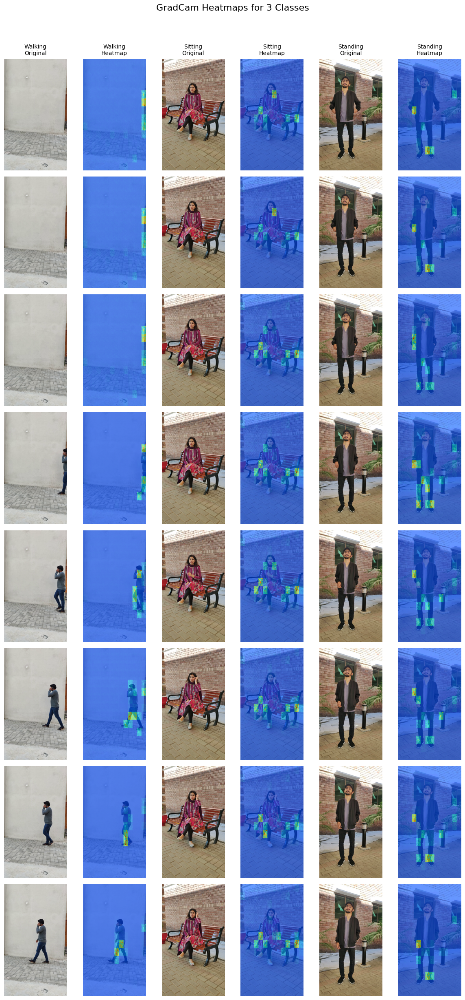

In [62]:
videos = {
    "Walking": walking_overlays,
    "Sitting": sitting_overlays,
    "Standing": standing_overlays
}

NUM_FRAMES = 8
plt.figure(figsize=(12, NUM_FRAMES*3))
plt.suptitle("GradCam Heatmaps for 3 Classes", fontsize=16, y=1.02)

for vid_idx, (vid_name, overlays) in enumerate(videos.items()):
    for i, (frame, overlay) in enumerate(overlays):
        ax = plt.subplot(NUM_FRAMES, 6, i*6 + vid_idx*2 + 1)
        ax.imshow(frame)
        ax.axis("off")
        if i == 0:
            ax.set_title(f"{vid_name}\nOriginal", fontsize=10)

        ax = plt.subplot(NUM_FRAMES, 6, i*6 + vid_idx*2 + 2)
        ax.imshow(overlay)
        ax.axis("off")
        if i == 0:
            ax.set_title(f"{vid_name}\nHeatmap", fontsize=10)

plt.tight_layout()
plt.show()


# Attention Maps Visualization

In [7]:
import torch
import torch.nn.functional as F
import numpy as np
import cv2
import matplotlib.pyplot as plt
import torch.nn as nn

## Reading Frames

In [8]:
def read_video_frames(video_path, max_frames=64):
    cap = cv2.VideoCapture(video_path)
    frames = []
    count = 0
    while cap.isOpened() and count < max_frames:
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)
        count += 1
    cap.release()
    return frames

frames_walking = read_video_frames("/kaggle/input/har-dataset/Walking/Walking_229.mp4")
frames_sitting = read_video_frames("/kaggle/input/har-dataset/Sitting/Sitting_129.mp4")
frames_standing = read_video_frames("/kaggle/input/har-dataset/Standing/Standing_129.mp4")


## Basic attention rollout function

In [9]:
def simple_attention_rollout(model: nn.Module, x: torch.Tensor, residual=True, head_fusion="mean"):
    """
    Basic attention rollout for timm-style ViT
    Args:
        model: your supervised ViT
        x: input tensor (1,C,H,W)
        residual: include residual connection (eye)
        head_fusion: "mean" or "max"
    Returns:
        hm: numpy array heatmap of shape (grid_h, grid_w)
    """
    # find attention modules
    attn_matrices = []
    for name, m in model.named_modules():
        if hasattr(m, "qkv") and hasattr(m, "num_heads") and hasattr(m, "scale"):
            # forward hook to grab attention
            def hook(module, inp, out):
                B, N, C = inp[0].shape
                qkv = module.qkv(inp[0]).reshape(B, N, 3, module.num_heads, C//module.num_heads).permute(2,0,3,1,4)
                q, k = qkv[0], qkv[1]
                attn = (q @ k.transpose(-2,-1)) * module.scale
                attn = attn.softmax(dim=-1)
                if head_fusion=="mean":
                    attn_matrices.append(attn.mean(dim=1))  # (B,N,N)
                else:
                    attn_matrices.append(attn.max(dim=1).values)
            m.register_forward_hook(hook)

    model.eval()
    with torch.no_grad():
        x = x.to(next(model.parameters()).device)
        _ = model(x)

    # rollout
    rollout = attn_matrices[0]
    for attn in attn_matrices[1:]:
        rollout = attn @ rollout

    if residual:
        N = rollout.shape[-1]
        rollout = rollout + torch.eye(N, device=rollout.device)
        rollout = rollout / rollout.sum(dim=-1, keepdim=True)

    cls_to_patches = rollout[0, 0, 1:]  # CLS token → patches

    # reshape to grid
    n_patches = cls_to_patches.shape[0]
    grid_size = int(n_patches ** 0.5)
    hm = cls_to_patches.view(grid_size, grid_size).cpu().numpy()
    hm = (hm - hm.min()) / (hm.max() - hm.min() + 1e-6)
    return hm


## Loading frames

In [ ]:
def sample_frames(video_path, num_frames=8, resize=(224,224)):
    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    indices = np.linspace(0, total_frames-1, num_frames, dtype=int)
    frames = []
    for i in indices:
        cap.set(cv2.CAP_PROP_POS_FRAMES, i)
        ret, frame = cap.read()
        if not ret:
            continue
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        if resize:
            frame = cv2.resize(frame, resize)
        frames.append(frame)
    cap.release()
    return frames

IMG_SIZE = 224  # set to your ViT input size

def frame_to_tensor(frame):
    # Resize frame to ViT expected size
    frame_resized = cv2.resize(frame, (IMG_SIZE, IMG_SIZE))
    
    # Convert HWC -> CHW and scale to [0,1]
    x = torch.tensor(frame_resized.transpose(2,0,1), dtype=torch.float32).unsqueeze(0) / 255.0
    return x

In [ ]:
def overlay_heatmap(hm, frame, alpha=0.4, cmap="jet"):
    import matplotlib.pyplot as plt
    import matplotlib

    # Resize heatmap to frame size
    import cv2
    H, W, _ = frame.shape
    hm_resized = cv2.resize(hm, (W, H))

    # Get colormap
    cmap_func = matplotlib.colormaps[cmap]  
    heatmap = cmap_func(hm_resized)[...,:3]  # H,W,3
    heatmap = (heatmap*255).astype(np.uint8)

    over = cv2.addWeighted(frame, 1-alpha, heatmap, alpha, 0)
    return over

## Plotting Attention Rollout Heatmaps for our model

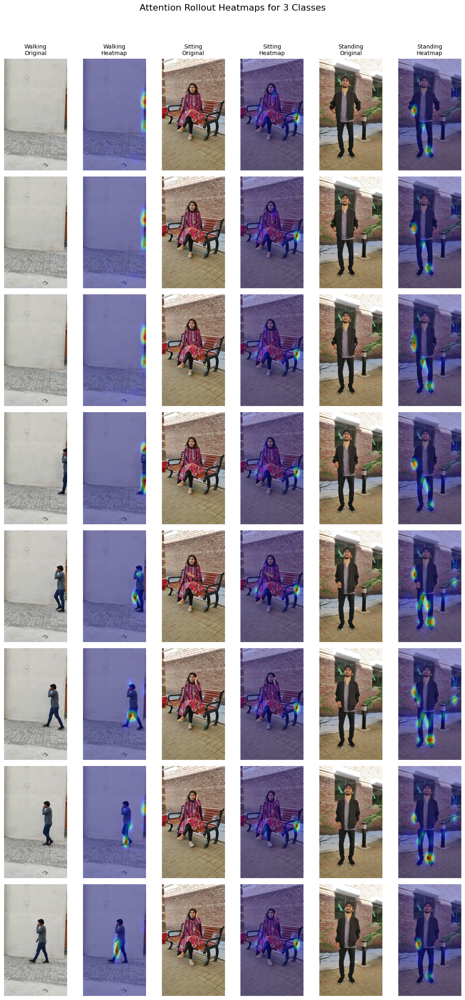

In [10]:
VIDEO_PATHS = ["/kaggle/input/har-dataset/Walking/Walking_229.mp4","/kaggle/input/har-dataset/Sitting/Sitting_129.mp4","/kaggle/input/har-dataset/Standing/Standing_129.mp4"]

NUM_FRAMES = 8
plt.figure(figsize=(12, NUM_FRAMES*3))
plt.suptitle("Attention Rollout Heatmaps for 3 Classes", fontsize=16, y=1.02)

for vid_idx, (vid_name, frame_tuples) in enumerate(videos.items()):  
    for i, (frame, _) in enumerate(frame_tuples[:NUM_FRAMES]):  
        x = frame_to_tensor(frame).to(next(model.parameters()).device) 
        hm = simple_attention_rollout(model, x)       # get attention map
        
        # resize heatmap to frame size
        H, W, _ = frame.shape
        hm_resized = cv2.resize(hm, (W, H))
        
        # convert heatmap to color
        cmap_func = plt.get_cmap("jet")
        heatmap = (cmap_func(hm_resized)[...,:3]*255).astype(np.uint8)
        
        # overlay heatmap on frame
        overlay = cv2.addWeighted(frame, 0.6, heatmap, 0.4, 0)
        
        # Plot original frame
        ax = plt.subplot(NUM_FRAMES, 6, i*6 + vid_idx*2 + 1)
        ax.imshow(frame)
        ax.axis("off")
        if i == 0:
            ax.set_title(f"{vid_name}\nOriginal", fontsize=10)

        # Plot heatmap overlay
        ax = plt.subplot(NUM_FRAMES, 6, i*6 + vid_idx*2 + 2)
        ax.imshow(overlay)
        ax.axis("off")
        if i == 0:
            ax.set_title(f"{vid_name}\nHeatmap", fontsize=10)

plt.tight_layout()
plt.show()

use if necessary to clear the cache, when the cuda memory is full.

In [ ]:
import torch
#torch.cuda.empty_cache()


# LRP (Attention × Gradient)

In [ ]:
import torch
import torch.nn as nn
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os

In [ ]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
IMG_SIZE = 224  # ViT input size

## Loading Frames

In [ ]:
def read_video_frames(video_path, max_frames=8, step=15):
    cap = cv2.VideoCapture(video_path)
    frames = []
    count, idx = 0, 0
    while cap.isOpened() and count < max_frames:
        ret, frame = cap.read()
        if not ret:
            break
        if idx % step == 0:
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frames.append(frame)
            count += 1
        idx += 1
    cap.release()
    return frames

In [ ]:
def frame_to_tensor(frame):
    frame_resized = cv2.resize(frame, (IMG_SIZE, IMG_SIZE))
    x = torch.tensor(frame_resized.transpose(2,0,1), dtype=torch.float32).unsqueeze(0) / 255.0
    return x

def overlay_heatmap(hm, frame, alpha=0.4, cmap="jet"):
    H, W, _ = frame.shape
    hm_resized = cv2.resize(hm, (W, H))
    cmap_func = plt.get_cmap(cmap)
    heatmap = (cmap_func(hm_resized)[...,:3]*255).astype(np.uint8)
    overlay = cv2.addWeighted(frame, 1-alpha, heatmap, alpha, 0)
    return overlay

## Functions for Layer-wise Relevance Propagation (A × G)

In [109]:
def _is_attention_module(m: nn.Module):
    return all(hasattr(m, a) for a in ["qkv", "num_heads", "scale", "attn_drop", "proj", "proj_drop"])

def _iter_attention_with_parents(model: nn.Module):
    for name, module in model.named_modules():
        if _is_attention_module(module):
            parent = model
            *path, leaf = name.split(".")
            for p in path: parent = getattr(parent, p)
            yield parent, leaf, module

class AttentionLRP(nn.Module):
    def __init__(self, attn: nn.Module):
        super().__init__()
        self.qkv, self.num_heads, self.scale = attn.qkv, attn.num_heads, attn.scale
        self.attn_drop, self.proj, self.proj_drop = attn.attn_drop, attn.proj, attn.proj_drop
        self.saved_attn = None

    def forward(self, x):
        B, N, C = x.shape
        qkv = self.qkv(x).reshape(B, N, 3, self.num_heads, C//self.num_heads).permute(2,0,3,1,4)
        q, k, v = qkv[0], qkv[1], qkv[2]
        attn_logits = (q @ k.transpose(-2,-1)) * self.scale
        attn = attn_logits.softmax(dim=-1)
        attn = self.attn_drop(attn)
        self.saved_attn = attn
        self.saved_attn.retain_grad()
        out = attn @ v
        out = out.transpose(1,2).reshape(B, N, C)
        out = self.proj(out)
        out = self.proj_drop(out)
        return out

def lrp_map(model: nn.Module, x: torch.Tensor, target_class: int|None = None):
    model = model.to(DEVICE).eval()
    x = x.to(DEVICE)

    originals, wrappers = [], []
    for parent, leaf, mod in _iter_attention_with_parents(model):
        originals.append((parent, leaf, mod))
        setattr(parent, leaf, AttentionLRP(mod))
        wrappers.append(getattr(parent, leaf))

    try:
        model.zero_grad(set_to_none=True)
        with torch.enable_grad():
            x = x.requires_grad_(True)
            logits = model(x)
            if logits.ndim == 1: logits = logits.unsqueeze(0)
            if target_class is None:
                target_class = int(logits.argmax(dim=-1).item())
            score = logits[0, target_class]
            score.backward()

        Rs = []
        for w in wrappers:
            A, G = w.saved_attn, w.saved_attn.grad
            if A is None or G is None: continue
            AXG = (A*G).clamp(min=0.0).mean(dim=1)
            B_, N, _ = AXG.shape
            AXG = AXG + torch.eye(N, device=AXG.device).view(1,N,N)
            AXG = AXG / (AXG.sum(dim=-1, keepdim=True)+1e-6)
            Rs.append(AXG.detach())

        R = Rs[0]
        for i in range(1, len(Rs)):
            R = R @ Rs[i]

        cls_to_patches = R[:,0,1:]
        if hasattr(model, "patch_embed") and hasattr(model.patch_embed, "grid_size"):
            gh, gw = model.patch_embed.grid_size
        else:
            g = int((cls_to_patches.shape[-1])**0.5); gh, gw = g, g

        hm = cls_to_patches[0].view(gh, gw)
        hm = (hm - hm.min())/(hm.max()-hm.min()+1e-6)
        return hm.cpu().numpy(), target_class
    finally:
        for parent, leaf, mod in originals:
            setattr(parent, leaf, mod)

def compute_lrp(model, x, target_class=None):
    hm, _ = lrp_map(model, x, target_class)
    return hm

import copy
def compute_lrp_for_frame(model, x):
    # Make a fresh copy of model for LRP
    model_copy = copy.deepcopy(model)
    hm, target_class_idx = lrp_map(model_copy, x)
    return hm, target_class_idx

## Plotting the LRP heatmaps

In [ ]:
VIDEO_PATHS = [
    "/kaggle/input/har-dataset/Walking/Walking_224.mp4",
    "/kaggle/input/har-dataset/Sitting/Sitting_125.mp4",
    "/kaggle/input/har-dataset/Standing/Standing_25.mp4"
]

videos = {vp: read_video_frames(vp, max_frames=8) for vp in VIDEO_PATHS}

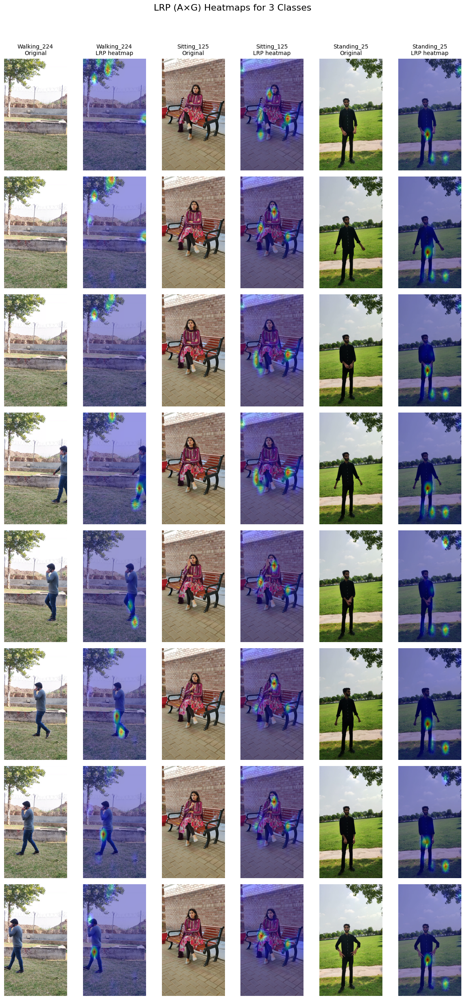

In [111]:
NUM_FRAMES = 8
NUM_VIDEOS = len(videos)
plt.figure(figsize=(12, NUM_FRAMES*3))
plt.suptitle("LRP (A×G) Heatmaps for 3 Classes", fontsize=16, y=1.02)

for vid_idx, (vid_name, frames) in enumerate(videos.items()):
    short_name = os.path.basename(vid_name).split(".")[0]

    for i, frame in enumerate(frames):
        x = frame_to_tensor(frame).to(DEVICE)

        # compute LRP using model copy
        hm, target_class_idx = compute_lrp_for_frame(model, x)
        pred_class_name = class_names[target_class_idx]

        overlay = overlay_heatmap(hm, frame)

        ax_orig = plt.subplot(NUM_FRAMES, NUM_VIDEOS*2, i*NUM_VIDEOS*2 + vid_idx*2 + 1)
        ax_orig.imshow(frame)
        ax_orig.axis("off")
        if i == 0:
            ax_orig.set_title(f"{short_name}\nOriginal", fontsize=10)

        ax_overlay = plt.subplot(NUM_FRAMES, NUM_VIDEOS*2, i*NUM_VIDEOS*2 + vid_idx*2 + 2)
        ax_overlay.imshow(overlay)
        ax_overlay.axis("off")
        if i == 0:
            ax_overlay.set_title(f"{short_name}\nLRP heatmap", fontsize=10)

plt.tight_layout()
plt.show()


In [94]:
print(np.mean(frames[0]), np.mean(frames[1]))


121.97668016975308 121.99106272505144
